# Data Import and Augmentation


In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = '/content'
!kaggle datasets download -d rdxesss/irish-sign-language-motion-history-images-dataset
# !unzip \*.zip && rm *.zip

100% 1.23G/1.23G [00:45<00:00, 32.2MB/s]
100% 1.23G/1.23G [00:45<00:00, 28.9MB/s]


In [ ]:
# import shutil

# # Define the path to the folder to be deleted
# folder_path = '/content/augmentedimages'

# try:
#     # Attempt to delete the folder
#     shutil.rmtree(folder_path)
#     print(f"Folder '{folder_path}' successfully deleted.")
# except Exception as e:
#     # Handle any errors that might occur during deletion
#     print(f"Error deleting folder '{folder_path}': {e}")


Folder '/content/augmentedimages' successfully deleted.


In [ ]:
import zipfile
import os

# Define the path to the ZIP file and the extraction target directory
zip_file_path = '/content/irish-sign-language-motion-history-images-dataset.zip'
target_directory = '/content/alphabet'

# Ensure the target directory exists, if not, create it
if not os.path.exists(target_directory):
    os.makedirs(target_directory)

# Open the ZIP file and extract its contents
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(target_directory)

print(f'Files extracted to {target_directory}')


Files extracted to /content/alphabet


In [ ]:
%%capture

import os
import shutil

# Define the source and destination directories
source_root = '/content/alphabet'
destination_root = '/content/dataset'

# Iterate over each letter folder (A to Z)
for letter in os.listdir(source_root):
    letter_folder = os.path.join(source_root, letter)

    # Check if the item is a directory
    if os.path.isdir(letter_folder):
        # Iterate over subfolders within each letter folder
        for subfolder in os.listdir(letter_folder):
            subfolder_path = os.path.join(letter_folder, subfolder)

            # Check if the item is a directory
            if os.path.isdir(subfolder_path):
                max_file = None
                max_number = float('-inf')  # Initialize to negative infinity

                # Iterate over files in the subfolder
                for file_name in os.listdir(subfolder_path):
                    # Split the file name to extract the number part
                    parts = file_name.split('_')
                    if len(parts) > 1:
                        number_part = parts[-1].split('.')[0]  # Remove the extension
                        try:
                            number = int(number_part)
                            if number > max_number:
                                max_number = number
                                max_file = file_name
                        except ValueError:
                            pass  # Skip if the number part is not an integer

                # If a file with a valid number was found, copy it to the destination folder
                if max_file:
                    source_file = os.path.join(subfolder_path, max_file)
                    destination_folder = os.path.join(destination_root, letter)
                    os.makedirs(destination_folder, exist_ok=True)
                    destination_file = os.path.join(destination_folder, max_file)
                    shutil.copyfile(source_file, destination_file)
                    print(f"Copied {max_file} to {destination_folder}")

print("Copying complete.")


In [ ]:
# import imgaug as ia
# import imgaug.augmenters as iaa
# import numpy as np
# import cv2
# import os
# from sklearn.model_selection import train_test_split

# # Define your augmenters
# seq = iaa.Sequential([
#     iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),
#     iaa.Multiply((0.8, 1.2)),
#     iaa.LinearContrast((0.75, 1.5)),
#     iaa.PerspectiveTransform(scale=(0.01, 0.15)),
#     iaa.GaussianBlur(sigma=(0, 3.0))
# ])

# def load_images_from_folder(folder):
#     images = []
#     for filename in os.listdir(folder):
#         img = cv2.imread(os.path.join(folder, filename))
#         if img is not None:
#             images.append(img)
#     return images

# def augment_images(image_list, augmenter, repetitions):
#     augmented_images = []
#     for img in image_list:
#         for _ in range(repetitions):
#             image_aug = augmenter.augment_image(img)
#             augmented_images.append(image_aug)
#     return augmented_images

# # Path to your dataset
# dataset_path = '/content/dataset'

# # Load images and split
# X_train, X_test = [], []
# for letter in os.listdir(dataset_path):
#     images = load_images_from_folder(os.path.join(dataset_path, letter))
#     train, test = train_test_split(images, test_size=0.2, random_state=42)
#     X_train.extend(train)
#     X_test.extend(test)

# # Decide how many times to augment each image
# repetitions = 20

# # Augment the training images
# X_train_aug = augment_images(X_train, seq, repetitions)

# # Print the total number of images
# print(f'Total number of training images after augmentation: {len(X_train_aug)}')
# print(f'Total number of test images: {len(X_test)}')

# # Now X_train_aug contains the original training images augmented 4 times each
# # X_test can be used as your testing set without augmentation




# import matplotlib.pyplot as plt

# # Display the first few augmented images
# plt.figure(figsize=(20, 10))
# for i in range(min(len(X_train_aug), 10)):  # Show up to 10 images
#     plt.subplot(2, 5, i + 1)
#     plt.imshow(cv2.cvtColor(X_train_aug[i], cv2.COLOR_BGR2RGB))
#     plt.axis('off')
# plt.show()


In [ ]:
# import imgaug as ia
# import imgaug.augmenters as iaa
# import numpy as np
# import cv2
# import os
# from sklearn.model_selection import train_test_split

# # Define your augmenters
# datagen = iaa.Sequential([
#     iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),
#     iaa.Multiply((0.8, 1.2)),
#     iaa.LinearContrast((0.75, 1.5)),
#     iaa.GaussianBlur(sigma=(0, 3.0))
# ])

# def load_images_from_folder(folder):
#     images = []
#     filenames = []
#     for filename in os.listdir(folder):
#         img = cv2.imread(os.path.join(folder, filename))
#         if img is not None:
#             images.append(img)
#             filenames.append(filename)
#     return images, filenames

# def augment_images(image_list, filenames, augmenter, repetitions, save_path):
#     if not os.path.exists(save_path):
#         os.makedirs(save_path)
#     for img, filename in zip(image_list, filenames):
#         for i in range(repetitions):
#             image_aug = augmenter.augment_image(img)
#             # Construct a new filename for the augmented image
#             aug_filename = f"aug_{i}_{filename}"
#             cv2.imwrite(os.path.join(save_path, aug_filename), image_aug)

# # Path to your dataset
# dataset_path = '/content/dataset'
# augmented_images_path = '/content/augmentedimages'

# # Iterate over each letter subfolder
# for letter in sorted(os.listdir(dataset_path)):
#     letter_path = os.path.join(dataset_path, letter)
#     if os.path.isdir(letter_path):
#         images, filenames = load_images_from_folder(letter_path)
#         # Define the save path for augmented images of the current letter
#         save_path = os.path.join(augmented_images_path, letter)
#         # Augment the images and save them
#         augment_images(images, filenames, datagen, 5, save_path)

# print('Augmentation completed and images saved according to the original folder structure.')


Augmentation completed and images saved according to the original folder structure.


Processing A...


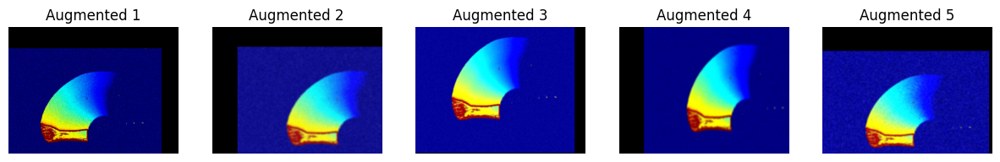

Processing B...


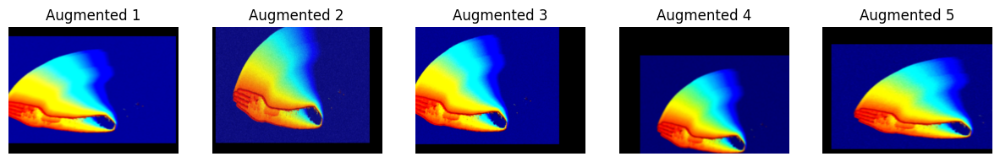

Processing C...


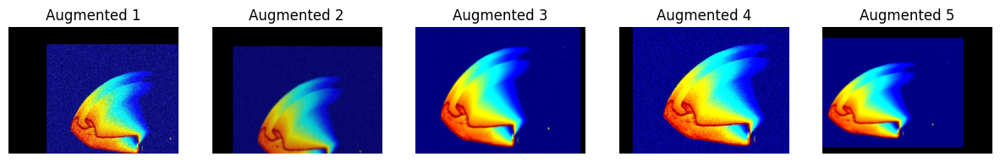

Processing D...


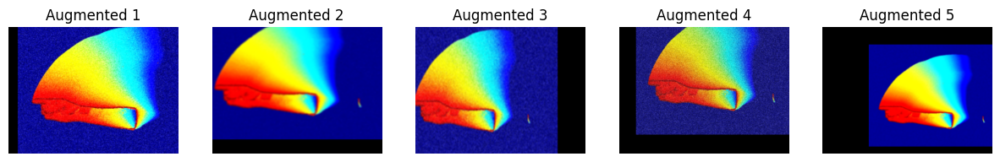

Processing E...


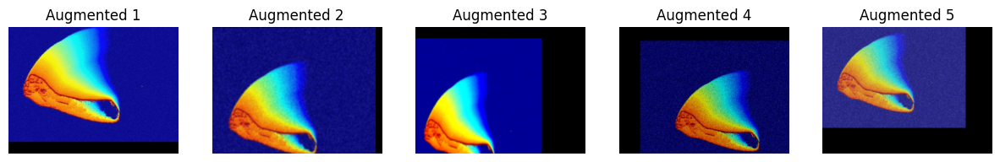

Processing F...


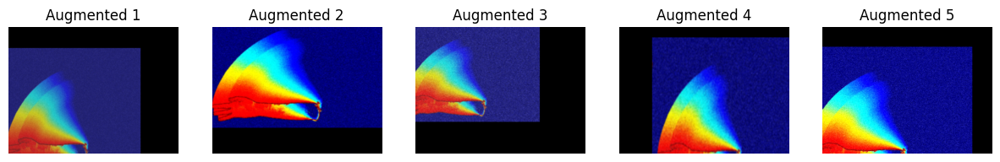

Processing G...


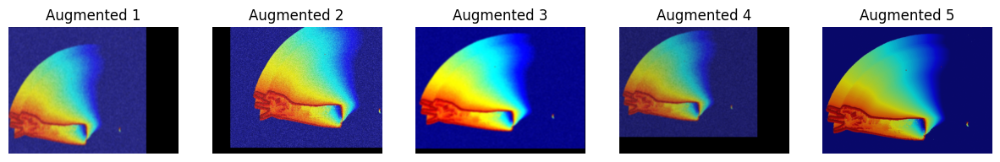

Processing H...


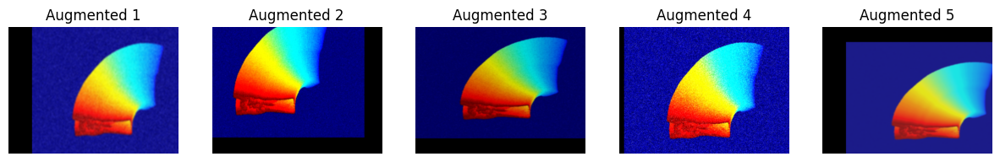

Processing I...


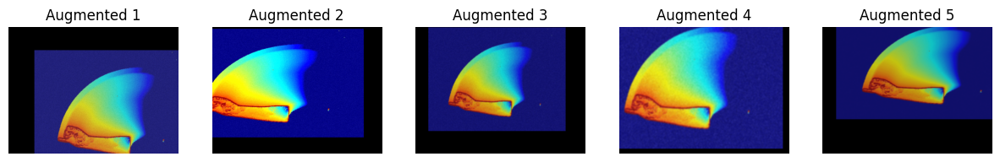

Processing J...


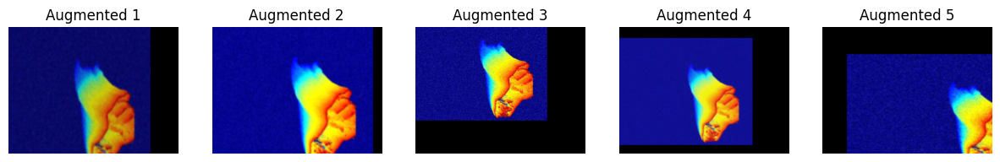

Processing K...


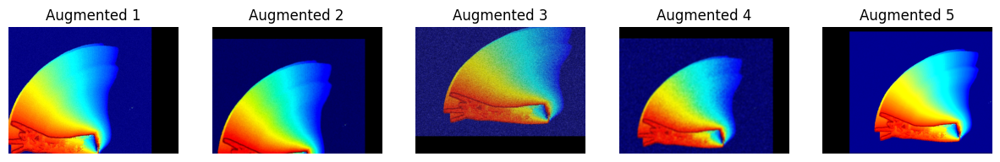

Processing L...


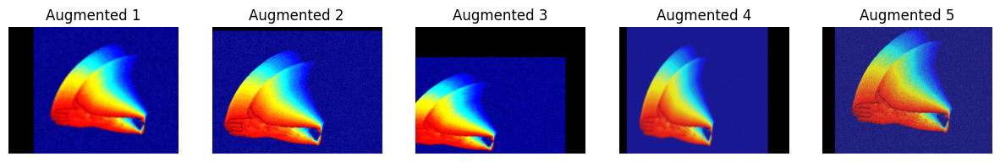

Processing M...


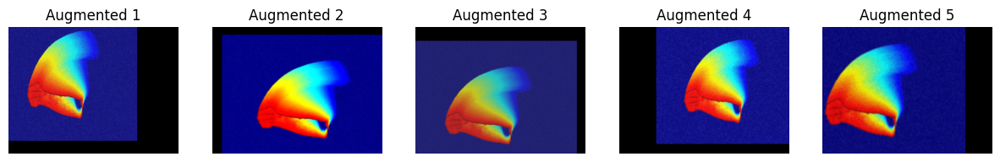

Processing N...


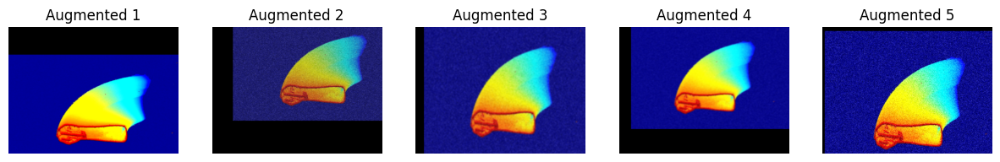

Processing O...


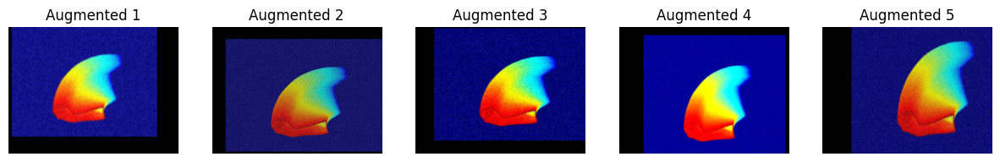

Processing P...


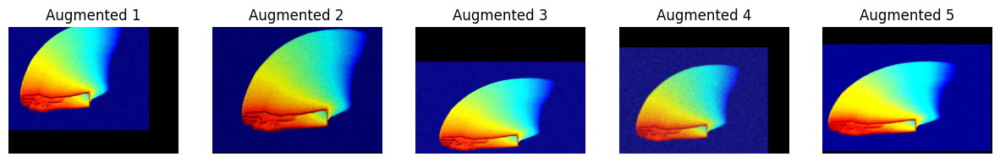

Processing Q...


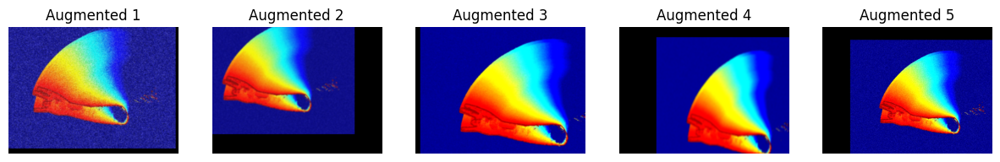

Processing R...


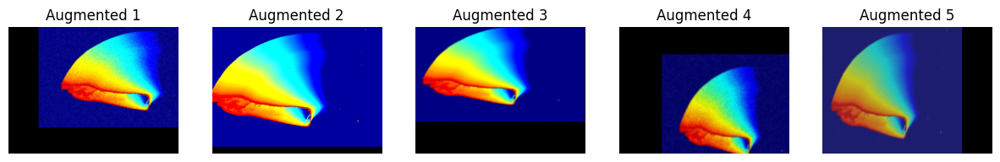

Processing S...


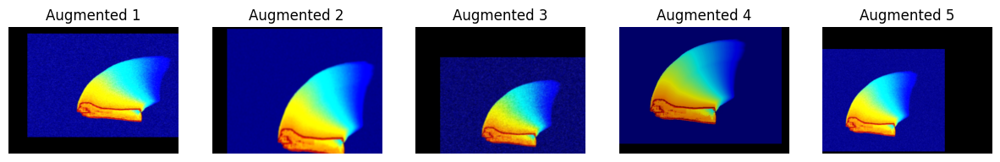

Processing T...


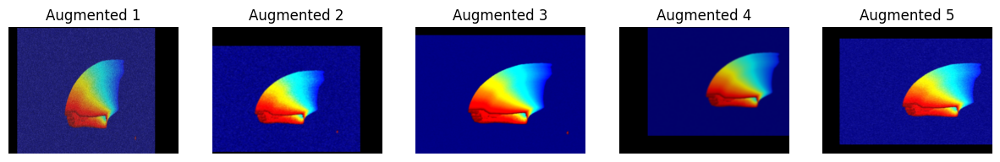

Processing U...


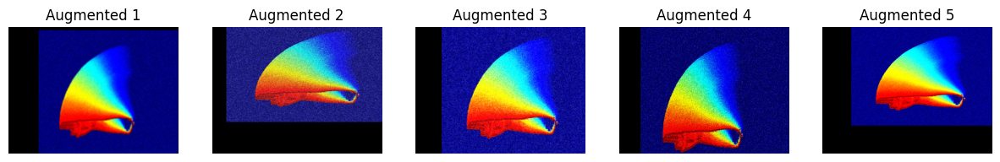

Processing V...


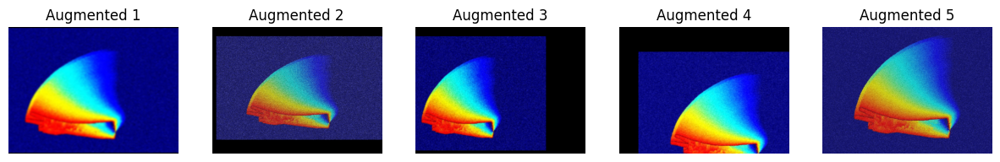

Processing W...


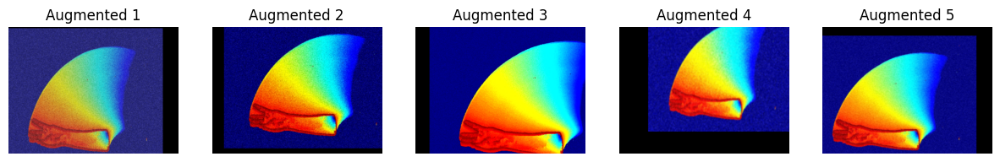

Processing X...


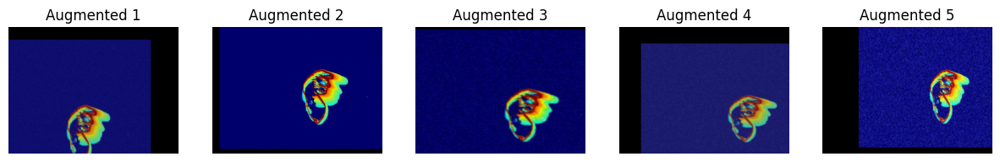

Processing Y...


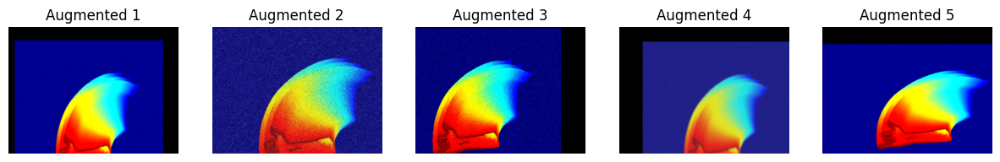

Processing Z...


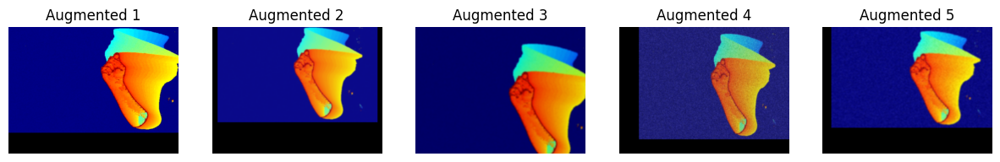

In [ ]:
import imgaug as ia
import imgaug.augmenters as iaa
import numpy as np
import cv2
import os
from sklearn.model_selection import train_test_split

# # Define your augmenters
# datagen = iaa.Sequential([
#     iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),
#     iaa.Multiply((0.8, 1.2)),
#     iaa.LinearContrast((0.75, 1.5)),
#     iaa.GaussianBlur(sigma=(0, 3.0))
# ])

# Define your augmenters with zoom augmentation
# datagen = iaa.Sequential([
#     iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),
#     iaa.Multiply((0.8, 1.2)),
#     iaa.LinearContrast((0.75, 1.5)),
#     iaa.GaussianBlur(sigma=(0, 3.0)),
#     iaa.Affine(
#         scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}  # Zoom in or out between 80% and 120%
#     )
# ])

from imgaug import augmenters as iaa

datagen = iaa.Sequential([
    iaa.AdditiveGaussianNoise(scale=(0, 0.2*255)),  # Add Gaussian noise
    iaa.Multiply((0.8, 1.2)),  # Adjust brightness
    iaa.LinearContrast((0.75, 1.5)),  # Adjust contrast
    iaa.GaussianBlur(sigma=(0, 3.0)),  # Apply Gaussian blur
    iaa.Affine(
        scale={"x": (0.8, 1.2), "y": (0.8, 1.2)},  # Zoom in/out between 80% and 120%
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}  # Translate by -20% to +20% on both axes
    )
])



def load_images_from_folder(folder):
    images = []
    filenames = []
    for filename in os.listdir(folder):
        img = cv2.imread(os.path.join(folder, filename))
        if img is not None:
            images.append(img)
            filenames.append(filename)
    return images, filenames

def augment_images(image_list, filenames, augmenter, repetitions, save_path):
    if not os.path.exists(save_path):
        os.makedirs(save_path)
    for img, filename in zip(image_list, filenames):
        for i in range(repetitions):
            image_aug = augmenter.augment_image(img)
            # Construct a new filename for the augmented image
            aug_filename = f"aug_{i}_{filename}"
            cv2.imwrite(os.path.join(save_path, aug_filename), image_aug)

# Path to your dataset
dataset_path = '/content/dataset'
augmented_images_path = '/content/augmentedimages'

# Ask the user for the number of times to augment each image
repetitions = int(input("Enter the number of times to augment each image: "))

# Iterate over each letter subfolder
for letter in sorted(os.listdir(dataset_path)):
    letter_path = os.path.join(dataset_path, letter)
    if os.path.isdir(letter_path):
        images, filenames = load_images_from_folder(letter_path)
        # Define the save path for augmented images of the current letter
        save_path = os.path.join(augmented_images_path, letter)
        # Augment the images and save them
        augment_images(images, filenames, datagen, repetitions, save_path)

print('Augmentation completed and images saved according to the original folder structure.')


In [ ]:
# import matplotlib.pyplot as plt

# def display_augmented_images(image_list, num_images=5):
#     """
#     Display a specified number of augmented images with descriptions.

#     Parameters:
#     - image_list: List of augmented image arrays to display.
#     - num_images: Number of images to display. Defaults to 5.
#     """
#     if len(image_list) < num_images:
#         num_images = len(image_list)

#     plt.figure(figsize=(15, 3))
#     for i, img in enumerate(image_list[:num_images]):
#         ax = plt.subplot(1, num_images, i + 1)
#         ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
#         ax.set_title(f"Augmented {i+1}")
#         plt.axis('off')
#     plt.show()

# def augment_images_and_display(image_list, filenames, augmenter, repetitions, save_path):
#     """
#     Augment images, save them, and display a subset of the augmented images.
#     """
#     displayed_images = []
#     if not os.path.exists(save_path):
#         os.makedirs(save_path)
#     for img, filename in zip(image_list, filenames):
#         for i in range(repetitions):
#             image_aug = augmenter.augment_image(img)
#             aug_filename = f"aug_{i}_{filename}"
#             cv2.imwrite(os.path.join(save_path, aug_filename), image_aug)
#             if i < 5:  # Collect a few images for display
#                 displayed_images.append(image_aug)

#     # Display a subset of augmented images
#     display_augmented_images(displayed_images)

# # Example usage within your dataset processing loop
# for letter in sorted(os.listdir(dataset_path)):
#     letter_path = os.path.join(dataset_path, letter)
#     if os.path.isdir(letter_path):
#         print(f"Processing {letter}...")
#         images, filenames = load_images_from_folder(letter_path)
#         save_path = os.path.join(augmented_images_path, letter)
#         augment_images_and_display(images, filenames, datagen, repetitions, save_path)


In [ ]:
import os

augmented_images_path = '/content/augmentedimages'
total_files = 0

# Iterate over each letter subfolder and count the files
for letter in sorted(os.listdir(augmented_images_path)):
    letter_path = os.path.join(augmented_images_path, letter)
    if os.path.isdir(letter_path):
        file_count = len([name for name in os.listdir(letter_path) if os.path.isfile(os.path.join(letter_path, name))])
        print(f'Subfolder {letter}: {file_count} files')
        total_files += file_count

# Display the total number of files across all subfolders
print(f'Total number of files across all subfolders: {total_files}')


Subfolder A: 270 files
Subfolder B: 270 files
Subfolder C: 270 files
Subfolder D: 270 files
Subfolder E: 270 files
Subfolder F: 270 files
Subfolder G: 270 files
Subfolder H: 270 files
Subfolder I: 270 files
Subfolder J: 270 files
Subfolder K: 270 files
Subfolder L: 270 files
Subfolder M: 270 files
Subfolder N: 270 files
Subfolder O: 270 files
Subfolder P: 270 files
Subfolder Q: 270 files
Subfolder R: 270 files
Subfolder S: 270 files
Subfolder T: 270 files
Subfolder U: 270 files
Subfolder V: 270 files
Subfolder W: 270 files
Subfolder X: 270 files
Subfolder Y: 270 files
Subfolder Z: 270 files
Total number of files across all subfolders: 7020


# Pre Processing

In [ ]:
import shutil

folder_to_zip = '/content/augmentedimages'
output_zip_file = '/content/augmentedimages.zip'

shutil.make_archive(output_zip_file, 'zip', folder_to_zip)


'/content/augmentedimages.zip.zip'

In [ ]:
!pip install imutils
# Import Libraries

# Warning
import warnings
warnings.filterwarnings("ignore")

# Main
import os
import glob
import cv2
import numpy as np
import pandas as pd
import gc
import string
import time
import random
import imutils
from PIL import Image
from tqdm import tqdm
tqdm.pandas()

# Visualization
import matplotlib
import matplotlib.pyplot as plt
import plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from sklearn.manifold import TSNE

# Model
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout
from keras.models import load_model, Model
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping

In [ ]:
# Configuration
class CFG:
    batch_size = 16
    img_height = 160
    img_width = 120
    epochs = 10
    num_classes = 26
    img_channels = 3

def seed_everything(seed: int):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)


In [ ]:
# Labels
TRAIN_PATH = '/content/augmentedimages'
labels = labels = list(string.ascii_uppercase)
# alphabet = list(string.ascii_uppercase)
# labels.extend(alphabet)
# labels.extend(["del", "nothing", "space"])
print(labels)

['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


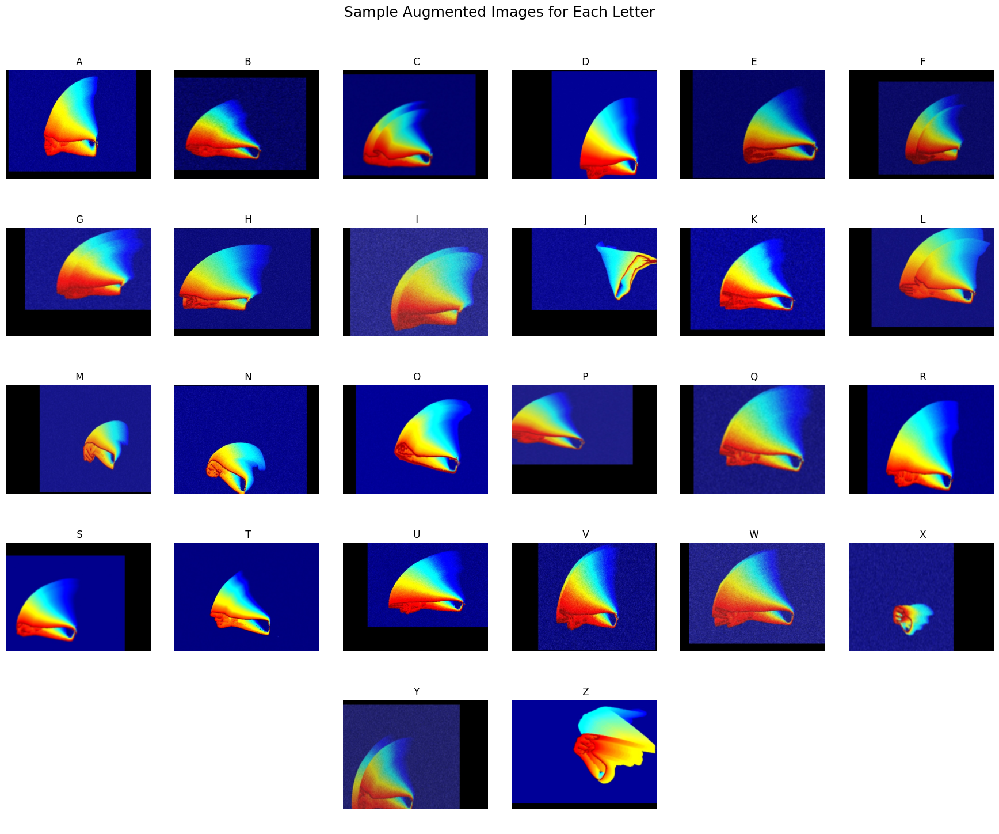

In [ ]:
# import os
# import cv2
# import matplotlib.pyplot as plt

# ALPHABET_PATH = '/content/augmentedimages/'  # Replace with the correct path to your alphabet images

# def sample_images():
#     alphabet_dirs = sorted([d for d in os.listdir(ALPHABET_PATH) if os.path.isdir(os.path.join(ALPHABET_PATH, d))])
#     num_letters = len(alphabet_dirs)
#     num_rows = num_letters // 5 + (num_letters % 5 > 0)  # Calculate the required number of rows for 5 columns

#     # Adjust figsize to your preference for image size
#     fig, axs = plt.subplots(num_rows, 5, figsize=(20, num_rows * 4))
#     axs = axs.ravel()  # Flatten the array of axes

#     for idx, ax in enumerate(axs):
#         ax.axis('off')  # Turn off axes by default
#         if idx < num_letters:
#             letter = alphabet_dirs[idx]
#             image_files = sorted(os.listdir(os.path.join(ALPHABET_PATH, letter)))
#             last_image_file = image_files[-1]  # Selecting the last image file
#             image_path = os.path.join(ALPHABET_PATH, letter, last_image_file)
#             image = cv2.imread(image_path)
#             image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#             ax.imshow(image)
#             ax.set_title(letter.upper(), fontsize=20, color='white')  # Set the title to the letter
#             ax.text(0.5, -0.1, f'Last image from {letter}', horizontalalignment='center', verticalalignment='center', transform=ax.transAxes, fontsize=10, color='white')  # Add caption
#             for spine in ax.spines.values():  # Set the border color if desired
#                 spine.set_edgecolor('white')

#     # Set a super title for the entire figure if desired
#     plt.suptitle('Alphabet Images', fontsize=24, color='white')

#     plt.tight_layout(pad=3.0)  # Increase padding to accommodate for captions
#     plt.show()

# sample_images()







import os
import cv2
import matplotlib.pyplot as plt

ALPHABET_PATH = '/content/augmentedimages/'  # Update with the actual path to your alphabet images

def sample_images_elegant_presentation():
    alphabet_dirs = sorted([d for d in os.listdir(ALPHABET_PATH) if os.path.isdir(os.path.join(ALPHABET_PATH, d))])
    total_letters = len(alphabet_dirs)
    num_cols = 6
    num_rows = 5
    items_in_last_row = total_letters % num_cols if total_letters % num_cols != 0 else num_cols
    padding_each_side = (num_cols - items_in_last_row) // 2 if total_letters < num_cols * num_rows else 0

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(18, 15), subplot_kw={'xticks': [], 'yticks': []})
    axs = axs.ravel()

    # Make all axes invisible initially
    for ax in axs:
        ax.axis('off')

    letter_idx = 0
    for idx, ax in enumerate(axs):
        row = idx // num_cols
        col = idx % num_cols

        # Centering logic for the last row
        if row == num_rows - 1 and padding_each_side > 0:
            if col < padding_each_side or col >= num_cols - padding_each_side:
                continue  # Skip the loop iteration to leave padding columns empty

        if letter_idx < total_letters:
            letter = alphabet_dirs[letter_idx]
            image_files = sorted(os.listdir(os.path.join(ALPHABET_PATH, letter)))
            if image_files:  # Check if there are images to display
                last_image_file = image_files[-1]
                image_path = os.path.join(ALPHABET_PATH, letter, last_image_file)
                image = cv2.imread(image_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                ax.imshow(image)
                ax.set_title(f" {letter.upper()}", fontsize=12, color='black', weight='normal')
                ax.axis('off')  # Ensure axis is turned off for visible subplots
                letter_idx += 1

    plt.suptitle('Sample Augmented Images for Each Letter', fontsize=18, color='black', weight='normal')
    plt.tight_layout(pad=3.0)
    plt.show()

sample_images_elegant_presentation()


In [ ]:

# Create Metadata
list_path = []
list_labels = []
for label in labels:
    label_path = os.path.join(TRAIN_PATH, label, "*")
    image_files = glob.glob(label_path)

    sign_label = [label] * len(image_files)

    list_path.extend(image_files)
    list_labels.extend(sign_label)

metadata = pd.DataFrame({
    "image_path": list_path,
    "label": list_labels
})

metadata

,image_path,label
0,/content/augmentedimages/A/aug_11_Person3-A-3-...,A
1,/content/augmentedimages/A/aug_2_Person5-A-2-c...,A
2,/content/augmentedimages/A/aug_1_Person6-A-3-c...,A
3,/content/augmentedimages/A/aug_12_Person6-A-2-...,A
4,/content/augmentedimages/A/aug_6_Person6-A-2-c...,A
...,...,...
7015,/content/augmentedimages/Z/aug_5_Person4-Z-2-c...,Z
7016,/content/augmentedimages/Z/aug_13_Person6-Z-3-...,Z
7017,/content/augmentedimages/Z/aug_12_Person3-Z-2-...,Z
7018,/content/augmentedimages/Z/aug_12_Person6-Z-3-...,Z


In [ ]:
# Split Dataset to Train 0.7, Val 0.15, and Test 0.15
X_train, X_test, y_train, y_test = train_test_split(
    metadata["image_path"], metadata["label"],
    test_size=0.2,
    random_state=2023,
    shuffle=True,
    stratify=metadata["label"]
)
data_train = pd.DataFrame({
    "image_path": X_train,
    "label": y_train
})

X_train, X_val, y_train, y_val = train_test_split(
    data_train["image_path"], data_train["label"],
    test_size=0.15/0.70,
    random_state=2023,
    shuffle=True,
    stratify=data_train["label"]
)
data_train = pd.DataFrame({
    "image_path": X_train,
    "label": y_train
})
data_val = pd.DataFrame({
    "image_path": X_val,
    "label": y_val
})
data_test = pd.DataFrame({
    "image_path": X_test,
    "label": y_test
})

display(data_train)
display(data_val)
display(data_test)

,image_path,label
938,/content/augmentedimages/D/aug_14_Person2-D-3-...,D
4747,/content/augmentedimages/R/aug_9_Person6-R-1-c...,R
4902,/content/augmentedimages/S/aug_7_Person2-S-3-c...,S
643,/content/augmentedimages/C/aug_9_Person4-C-3-c...,C
6159,/content/augmentedimages/W/aug_8_Person3-W-1-c...,W
...,...,...
75,/content/augmentedimages/A/aug_9_Person1-A-1-c...,A
5977,/content/augmentedimages/W/aug_12_Person3-W-2-...,W
1707,/content/augmentedimages/G/aug_13_Person6-G-3-...,G
1054,/content/augmentedimages/D/aug_12_Person2-D-1-...,D


,image_path,label
373,/content/augmentedimages/B/aug_4_Person4-B-2-c...,B
6330,/content/augmentedimages/X/aug_6_Person2-X-1-c...,X
5447,/content/augmentedimages/U/aug_11_Person3-U-3-...,U
7012,/content/augmentedimages/Z/aug_0_Person6-Z-2-c...,Z
2307,/content/augmentedimages/I/aug_8_Person2-I-1-c...,I
...,...,...
4584,/content/augmentedimages/Q/aug_4_Person4-Q-1-c...,Q
1354,/content/augmentedimages/F/aug_7_Person6-F-2-c...,F
5525,/content/augmentedimages/U/aug_5_Person4-U-1-c...,U
3768,/content/augmentedimages/N/aug_0_Person1-N-1-c...,N


,image_path,label
3729,/content/augmentedimages/N/aug_1_Person3-N-2-c...,N
88,/content/augmentedimages/A/aug_2_Person1-A-1-c...,A
3813,/content/augmentedimages/O/aug_8_Person2-O-3-c...,O
5002,/content/augmentedimages/S/aug_14_Person1-S-3-...,S
4354,/content/augmentedimages/Q/aug_6_Person4-Q-3-c...,Q
...,...,...
6163,/content/augmentedimages/W/aug_1_Person4-W-3-c...,W
4457,/content/augmentedimages/Q/aug_10_Person5-Q-1-...,Q
6486,/content/augmentedimages/Y/aug_5_Person6-Y-2-c...,Y
1729,/content/augmentedimages/G/aug_7_Person5-G-1-c...,G


In [ ]:
# Data Augmentation (Just Rescale)
def data_augmentation():
    datagen = ImageDataGenerator(rescale=1/255.,)
    # Training Dataset
    train_generator = datagen.flow_from_dataframe(
        data_train,
        directory="./",
        x_col="image_path",
        y_col="label",
        class_mode="categorical",
        batch_size=CFG.batch_size,
        target_size=(CFG.img_height, CFG.img_width),
    )

    # Validation Dataset
    validation_generator = datagen.flow_from_dataframe(
        data_val,
        directory="./",
        x_col="image_path",
        y_col="label",
        class_mode="categorical",
        batch_size=CFG.batch_size,
        target_size=(CFG.img_height, CFG.img_width),
    )

    # Testing Dataset
    test_generator = datagen.flow_from_dataframe(
        data_test,
        directory="./",
        x_col="image_path",
        y_col="label",
        class_mode="categorical",
        batch_size=1,
        target_size=(CFG.img_height, CFG.img_width),
        shuffle=False
    )

    return train_generator, validation_generator, test_generator




seed_everything(2023)
train_generator, validation_generator, test_generator = data_augmentation()

Found 4412 validated image filenames belonging to 26 classes.
Found 1204 validated image filenames belonging to 26 classes.
Found 1404 validated image filenames belonging to 26 classes.


# Denenet 121

In [ ]:
import keras
base_model = keras.applications.DenseNet121(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

29084464/29084464 [==============================] - 0s 0us/step


In [ ]:
base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 120, 3)]     0         
                                                                 
 densenet121 (Functional)    (None, 5, 3, 1024)        7037504   
                                                                 
 global_average_pooling2d (  (None, 1024)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 26)                26650     
                                                                 
Total params: 7064154 (26.95 MB)
Trainable params: 26650 (104.10 KB)
Non-trainable params: 7037504 (26.85 MB)
_________________________________________________________________


In [ ]:
# # Callbacks
# checkpoint = ModelCheckpoint('vgg19.h5', save_best_only=True, monitor='val_categorical_accuracy', mode='max')

In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint


# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/D121.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/D121.csv',  separator=",")
]


# # # Define callbacks for learning rate scheduling, logging and best checkpoints saving
# callbackss = [
#     ModelCheckpoint('/content/drive/MyDrive/ISL Sign Language Work/Weights/InceptionResnetV2.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
# #     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
# #     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
#     CSVLogger('/content/drive/MyDrive/ISL Sign Language Work/CSV/InceptionResnetV2.csv',  separator=",")
# ]

In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)


Epoch 1/20
275/275 [==============================] - 55s 159ms/step - loss: 0.1104 - categorical_accuracy: 0.7789 - val_loss: 0.1172 - val_categorical_accuracy: 0.7650
Epoch 2/20
275/275 [==============================] - 21s 75ms/step - loss: 0.0835 - categorical_accuracy: 0.8267 - val_loss: 0.1100 - val_categorical_accuracy: 0.7700
Epoch 3/20
275/275 [==============================] - 20s 73ms/step - loss: 0.0689 - categorical_accuracy: 0.8565 - val_loss: 0.1043 - val_categorical_accuracy: 0.7633
Epoch 4/20
275/275 [==============================] - 18s 67ms/step - loss: 0.0554 - categorical_accuracy: 0.8785 - val_loss: 0.0861 - val_categorical_accuracy: 0.8192
Epoch 5/20
275/275 [==============================] - 21s 75ms/step - loss: 0.0469 - categorical_accuracy: 0.9010 - val_loss: 0.0797 - val_categorical_accuracy: 0.8358
Epoch 6/20
275/275 [==============================] - 18s 67ms/step - loss: 0.0403 - categorical_accuracy: 0.9197 - val_loss: 0.0749 - val_categorical_accuracy

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 16s 58ms/step - loss: 0.0076 - categorical_accuracy: 0.9884
Evaluate Train Accuracy: 98.84%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 6s 72ms/step - loss: 0.0490 - categorical_accuracy: 0.8821
Evaluate Validation Accuracy: 88.21%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 23s 15ms/step - loss: 0.0515 - categorical_accuracy: 0.8739
Evaluate Test Accuracy: 87.39%


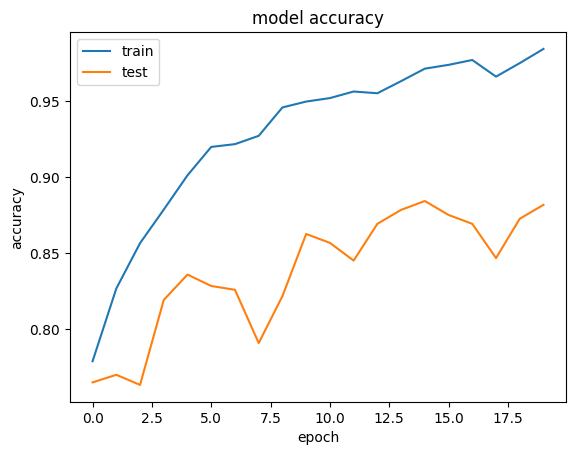

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

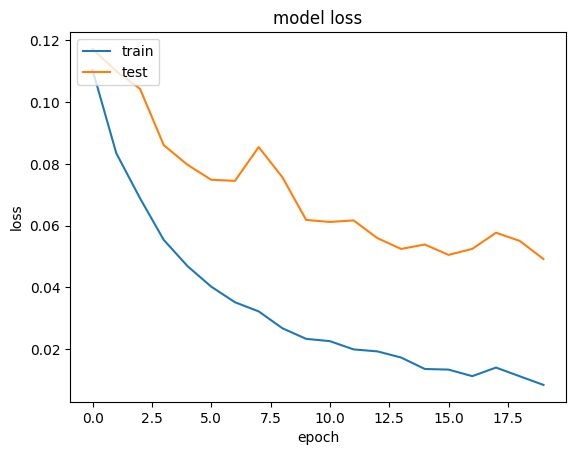

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()



In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/D121.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 23s 14ms/step


In [ ]:
# # Create Figure
# fig = go.Figure()

# # Heatmap
# fig.add_trace(
#     go.Heatmap(
#         z=confusion_matrix,
#         x=labels,
#         y=labels,
#         text=confusion_matrix,
#         texttemplate="%{text}",
#         textfont={"size":8},
#         colorscale=[[0, '#f4f4f4'],[1.0, '#76503d']],
#         showscale = False,
#         ygap = 5,
#         xgap = 5,
#         hovertemplate=
#         '''
#         Actual: %{y}
#         Predicted: %{x}
#         Total: %{text}
#         ''',
#         name="Confusion Matrix Inception Resnet V2"
#     )
# )

# # Update Axes
# fig.update_xaxes(title="Predicted Values", tickfont_size=10)
# fig.update_yaxes(title="Actual Values", tickfont_size=10)

# # Update Layout
# fig.update_layout(title_text='Confusion Matrix Inception Resnet V2', title_x=0.5, font_size=14,
#                   width=1050,
#                   height=1115,
#                   plot_bgcolor='white',
#                   showlegend=False,
# )

# # Show
# fig.show()

In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix Densenet 121"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix Densenet 121', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 21s 13ms/step
              precision    recall  f1-score   support

           A       0.89      0.93      0.91        54
           B       0.85      0.93      0.88        54
           C       1.00      0.96      0.98        54
           D       0.89      0.91      0.90        54
           E       0.63      0.91      0.74        54
           F       0.93      0.78      0.85        54
           G       0.83      0.83      0.83        54
           H       0.86      0.78      0.82        54
           I       0.96      0.98      0.97        54
           J       1.00      1.00      1.00        54
           K       0.78      0.85      0.81        54
           L       0.98      0.98      0.98        54
           M       0.95      0.74      0.83        54
           N       0.76      0.83      0.80        54
           O       0.89      0.94      0.92        54
           P       0.91      0.74      0.82        54
           Q       0.7

# VGG19

In [ ]:
import keras
base_model = keras.applications.VGG19(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

80134624/80134624 [==============================] - 0s 0us/step


In [ ]:
base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 120, 3)]     0         
                                                                 
 vgg19 (Functional)          (None, 5, 3, 512)         20024384  
                                                                 
 global_average_pooling2d (  (None, 512)               0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 26)                13338     
                                                                 
Total params: 20037722 (76.44 MB)
Trainable params: 13338 (52.10 KB)
Non-trainable params: 20024384 (76.39 MB)
_________________________________________________________________


In [ ]:
# # Callbacks
# checkpoint = ModelCheckpoint('vgg19.h5', save_best_only=True, monitor='val_categorical_accuracy', mode='max')

In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint


# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/VGG19.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/VGG19.csv',  separator=",")
]


# # # Define callbacks for learning rate scheduling, logging and best checkpoints saving
# callbackss = [
#     ModelCheckpoint('/content/drive/MyDrive/ISL Sign Language Work/Weights/InceptionResnetV2.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
# #     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
# #     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
#     CSVLogger('/content/drive/MyDrive/ISL Sign Language Work/CSV/InceptionResnetV2.csv',  separator=",")
# ]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)



# # Train the Model
# history = model.fit(
#     train_generator,
#     steps_per_epoch=train_generator.samples // CFG.batch_size,
#     epochs=CFG.epochs,
#     validation_data=validation_generator,
#     validation_steps=validation_generator.samples // CFG.batch_size,
#     callbacks=[checkpoint]
# )


Epoch 1/20
275/275 [==============================] - 30s 99ms/step - loss: 0.3135 - categorical_accuracy: 0.5698 - val_loss: 0.3296 - val_categorical_accuracy: 0.5350
Epoch 2/20
275/275 [==============================] - 17s 63ms/step - loss: 0.3009 - categorical_accuracy: 0.5896 - val_loss: 0.3182 - val_categorical_accuracy: 0.5383
Epoch 3/20
275/275 [==============================] - 18s 65ms/step - loss: 0.2909 - categorical_accuracy: 0.6015 - val_loss: 0.3084 - val_categorical_accuracy: 0.5558
Epoch 4/20
275/275 [==============================] - 17s 63ms/step - loss: 0.2810 - categorical_accuracy: 0.6037 - val_loss: 0.2988 - val_categorical_accuracy: 0.5742
Epoch 5/20
275/275 [==============================] - 19s 67ms/step - loss: 0.2719 - categorical_accuracy: 0.6281 - val_loss: 0.2915 - val_categorical_accuracy: 0.5908
Epoch 6/20
275/275 [==============================] - 17s 62ms/step - loss: 0.2628 - categorical_accuracy: 0.6331 - val_loss: 0.2864 - val_categorical_accuracy:

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 14s 49ms/step - loss: 0.1802 - categorical_accuracy: 0.7359
Evaluate Train Accuracy: 73.59%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 5s 60ms/step - loss: 0.2128 - categorical_accuracy: 0.6694
Evaluate Validation Accuracy: 66.94%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 12s 8ms/step - loss: 0.2058 - categorical_accuracy: 0.6752
Evaluate Test Accuracy: 67.52%


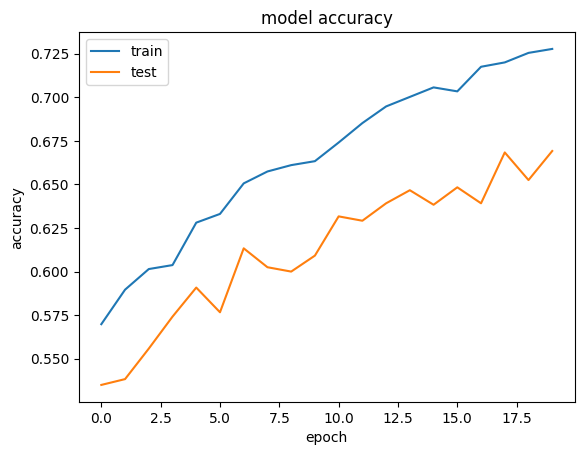

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

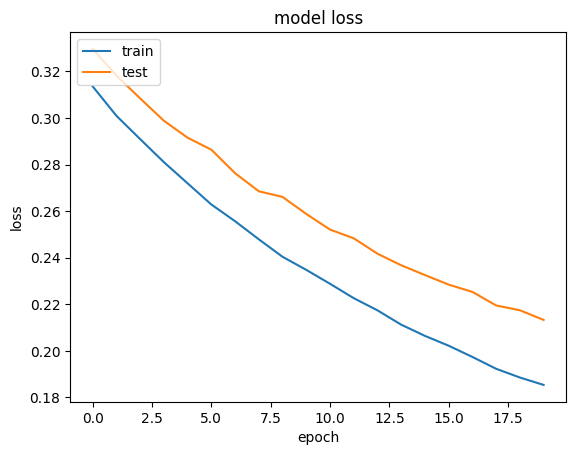

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()



In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/VGG19.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 17s 12ms/step


In [ ]:
# # Create Figure
# fig = go.Figure()

# # Heatmap
# fig.add_trace(
#     go.Heatmap(
#         z=confusion_matrix,
#         x=labels,
#         y=labels,
#         text=confusion_matrix,
#         texttemplate="%{text}",
#         textfont={"size":8},
#         colorscale=[[0, '#f4f4f4'],[1.0, '#76503d']],
#         showscale = False,
#         ygap = 5,
#         xgap = 5,
#         hovertemplate=
#         '''
#         Actual: %{y}
#         Predicted: %{x}
#         Total: %{text}
#         ''',
#         name="Confusion Matrix Inception Resnet V2"
#     )
# )

# # Update Axes
# fig.update_xaxes(title="Predicted Values", tickfont_size=10)
# fig.update_yaxes(title="Actual Values", tickfont_size=10)

# # Update Layout
# fig.update_layout(title_text='Confusion Matrix Inception Resnet V2', title_x=0.5, font_size=14,
#                   width=1050,
#                   height=1115,
#                   plot_bgcolor='white',
#                   showlegend=False,
# )

# # Show
# fig.show()

In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix VGG19"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix VGG19', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 16s 11ms/step
              precision    recall  f1-score   support

           A       0.64      0.67      0.65        54
           B       0.71      0.72      0.72        54
           C       0.96      0.87      0.91        54
           D       0.66      0.65      0.65        54
           E       0.45      0.65      0.53        54
           F       0.50      0.44      0.47        54
           G       0.43      0.80      0.55        54
           H       0.57      0.69      0.62        54
           I       0.92      0.67      0.77        54
           J       1.00      1.00      1.00        54
           K       0.66      0.85      0.74        54
           L       0.81      0.80      0.80        54
           M       0.67      0.87      0.76        54
           N       0.71      0.46      0.56        54
           O       0.78      0.78      0.78        54
           P       0.72      0.39      0.51        54
           Q       0.5

# Densenet169

In [ ]:
import keras
base_model = keras.applications.DenseNet169(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

51877672/51877672 [==============================] - 0s 0us/step
Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 160, 120, 3)]     0         
                                                                 
 densenet169 (Functional)    (None, 5, 3, 1664)        12642880  
                                                                 
 global_average_pooling2d_1  (None, 1664)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_1 (Dense)             (None, 26)                43290     
                                                                 
Total params: 12686170 (48.39 MB)
Trainable params: 43290 (169.10 KB)
Non-trainable params: 12642880 (48.23 MB)
_________________________________________________________________


In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/DenseNet169.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/DenseNet169.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 37s 90ms/step - loss: 0.4804 - categorical_accuracy: 0.3492 - val_loss: 0.3323 - val_categorical_accuracy: 0.4950
Epoch 2/20
275/275 [==============================] - 20s 71ms/step - loss: 0.2333 - categorical_accuracy: 0.6092 - val_loss: 0.2120 - val_categorical_accuracy: 0.6258
Epoch 3/20
275/275 [==============================] - 20s 72ms/step - loss: 0.1536 - categorical_accuracy: 0.7389 - val_loss: 0.1716 - val_categorical_accuracy: 0.6792
Epoch 4/20
275/275 [==============================] - 21s 75ms/step - loss: 0.1140 - categorical_accuracy: 0.7925 - val_loss: 0.1380 - val_categorical_accuracy: 0.7175
Epoch 5/20
275/275 [==============================] - 19s 69ms/step - loss: 0.0893 - categorical_accuracy: 0.8348 - val_loss: 0.1224 - val_categorical_accuracy: 0.7583
Epoch 6/20
275/275 [==============================] - 19s 69ms/step - loss: 0.0696 - categorical_accuracy: 0.8747 - val_loss: 0.1121 - val_categorical_accuracy:

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 15s 54ms/step - loss: 0.0075 - categorical_accuracy: 0.9909
Evaluate Train Accuracy: 99.09%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 7s 93ms/step - loss: 0.0629 - categorical_accuracy: 0.8372
Evaluate Validation Accuracy: 83.72%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 30s 20ms/step - loss: 0.0586 - categorical_accuracy: 0.8640
Evaluate Test Accuracy: 86.40%


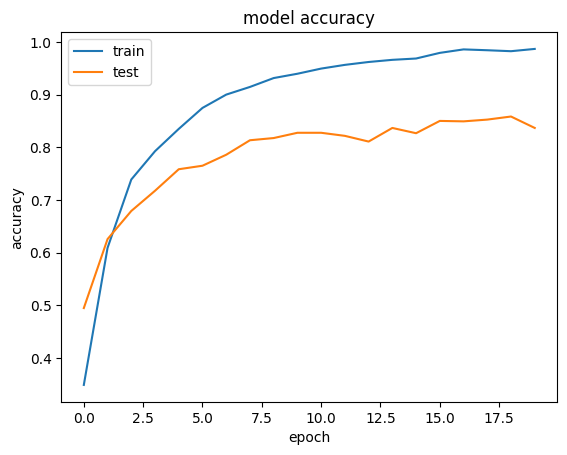

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

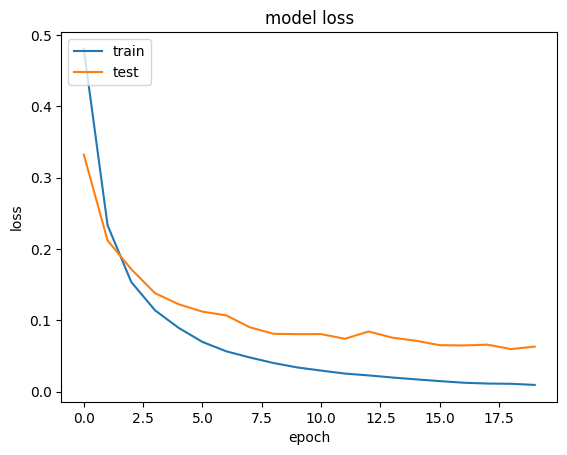

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()



In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/DenseNet169.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 29s 19ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix DenseNet169"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix DenseNet169', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 29s 19ms/step
              precision    recall  f1-score   support

           A       0.95      0.98      0.96        54
           B       0.78      0.67      0.72        54
           C       0.98      0.98      0.98        54
           D       0.80      0.80      0.80        54
           E       0.90      0.80      0.84        54
           F       0.84      0.70      0.77        54
           G       0.89      0.87      0.88        54
           H       0.81      0.78      0.79        54
           I       0.93      0.96      0.95        54
           J       1.00      1.00      1.00        54
           K       0.86      0.89      0.87        54
           L       0.98      0.96      0.97        54
           M       0.84      0.91      0.88        54
           N       0.90      0.83      0.87        54
           O       0.89      0.87      0.88        54
           P       0.53      0.91      0.67        54
           Q       0.8

# Densenet201

In [ ]:
import keras
base_model = keras.applications.DenseNet201(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

74836368/74836368 [==============================] - 1s 0us/step
Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 160, 120, 3)]     0         
                                                                 
 densenet201 (Functional)    (None, 5, 3, 1920)        18321984  
                                                                 
 global_average_pooling2d_2  (None, 1920)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_2 (Dense)             (None, 26)                49946     
                                                                 
Total params: 18371930 (70.08 MB)
Trainable params: 49946 (195.10 KB)
Non-trainable params: 18321984 (69.89 MB)
_________________________________________________________________


In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/DenseNet201.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/DenseNet201.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 39s 99ms/step - loss: 0.4389 - categorical_accuracy: 0.3917 - val_loss: 0.2559 - val_categorical_accuracy: 0.5900
Epoch 2/20
275/275 [==============================] - 22s 79ms/step - loss: 0.1886 - categorical_accuracy: 0.6897 - val_loss: 0.1785 - val_categorical_accuracy: 0.6583
Epoch 3/20
275/275 [==============================] - 22s 81ms/step - loss: 0.1224 - categorical_accuracy: 0.7784 - val_loss: 0.1294 - val_categorical_accuracy: 0.7650
Epoch 4/20
275/275 [==============================] - 21s 77ms/step - loss: 0.0880 - categorical_accuracy: 0.8355 - val_loss: 0.1097 - val_categorical_accuracy: 0.7817
Epoch 5/20
275/275 [==============================] - 19s 70ms/step - loss: 0.0652 - categorical_accuracy: 0.8763 - val_loss: 0.0970 - val_categorical_accuracy: 0.7808
Epoch 6/20
275/275 [==============================] - 22s 81ms/step - loss: 0.0513 - categorical_accuracy: 0.9035 - val_loss: 0.0785 - val_categorical_accuracy:

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 17s 63ms/step - loss: 0.0039 - categorical_accuracy: 0.9982
Evaluate Train Accuracy: 99.82%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 5s 62ms/step - loss: 0.0397 - categorical_accuracy: 0.8978
Evaluate Validation Accuracy: 89.78%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 32s 22ms/step - loss: 0.0426 - categorical_accuracy: 0.8903
Evaluate Test Accuracy: 89.03%


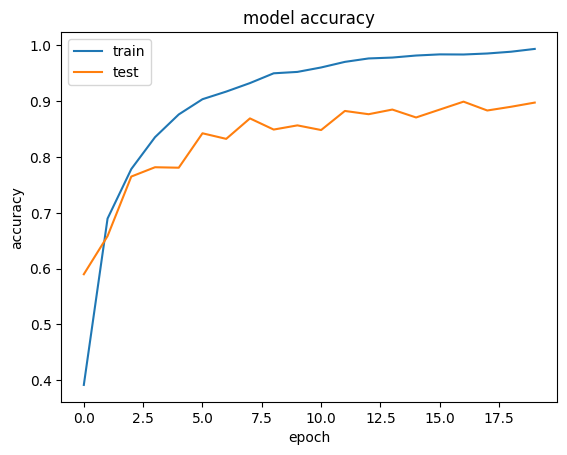

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

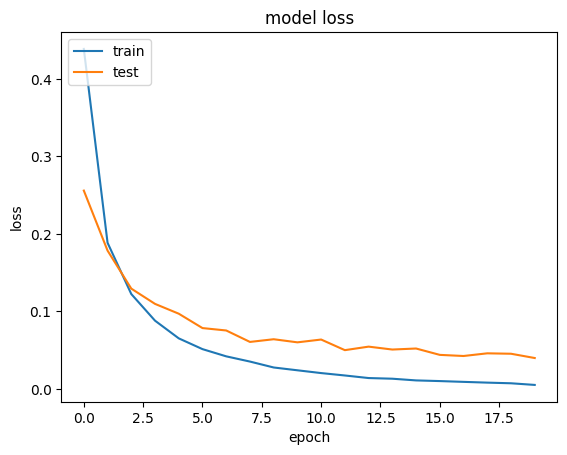

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()



In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/DenseNet201.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 52s 32ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix DenseNet201"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix DenseNet201', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 51s 33ms/step
              precision    recall  f1-score   support

           A       0.84      0.94      0.89        54
           B       0.88      0.81      0.85        54
           C       1.00      0.98      0.99        54
           D       0.81      0.81      0.81        54
           E       0.83      0.91      0.87        54
           F       0.69      0.96      0.81        54
           G       1.00      0.74      0.85        54
           H       0.89      0.89      0.89        54
           I       0.98      0.83      0.90        54
           J       1.00      1.00      1.00        54
           K       0.93      0.93      0.93        54
           L       0.91      0.98      0.95        54
           M       0.98      0.96      0.97        54
           N       0.89      0.91      0.90        54
           O       0.98      0.81      0.89        54
           P       0.82      0.85      0.84        54
           Q       0.7

# Inception Resnet V2

In [ ]:
import keras
base_model = keras.applications.InceptionResNetV2(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

219055592/219055592 [==============================] - 1s 0us/step
Model: "model_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 160, 120, 3)]     0         
                                                                 
 inception_resnet_v2 (Funct  (None, 3, 2, 1536)        54336736  
 ional)                                                          
                                                                 
 global_average_pooling2d_3  (None, 1536)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_3 (Dense)             (None, 26)                39962     
                                                                 
Total params: 54376698 (207.43 MB)
Trainable params: 39962 (156.10 KB)
Non-trainable params: 54336736 (207.28 MB)
__________

In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/InceptionResNetV2.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/InceptionResNetV2.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 39s 95ms/step - loss: 0.5121 - categorical_accuracy: 0.3355 - val_loss: 0.3730 - val_categorical_accuracy: 0.4533
Epoch 2/20
275/275 [==============================] - 22s 80ms/step - loss: 0.2847 - categorical_accuracy: 0.5325 - val_loss: 0.2480 - val_categorical_accuracy: 0.5750
Epoch 3/20
275/275 [==============================] - 24s 87ms/step - loss: 0.2113 - categorical_accuracy: 0.6217 - val_loss: 0.2404 - val_categorical_accuracy: 0.5975
Epoch 4/20
275/275 [==============================] - 22s 81ms/step - loss: 0.1680 - categorical_accuracy: 0.6770 - val_loss: 0.1596 - val_categorical_accuracy: 0.6583
Epoch 5/20
275/275 [==============================] - 20s 73ms/step - loss: 0.1470 - categorical_accuracy: 0.7109 - val_loss: 0.2061 - val_categorical_accuracy: 0.6417
Epoch 6/20
275/275 [==============================] - 23s 83ms/step - loss: 0.1153 - categorical_accuracy: 0.7577 - val_loss: 0.1414 - val_categorical_accuracy:

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 16s 58ms/step - loss: 0.0710 - categorical_accuracy: 0.8694
Evaluate Train Accuracy: 86.94%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 6s 78ms/step - loss: 0.1534 - categorical_accuracy: 0.7425
Evaluate Validation Accuracy: 74.25%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 37s 26ms/step - loss: 0.1474 - categorical_accuracy: 0.7764
Evaluate Test Accuracy: 77.64%


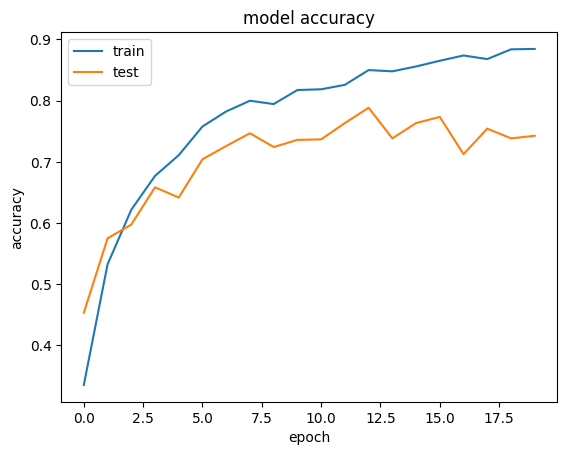

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

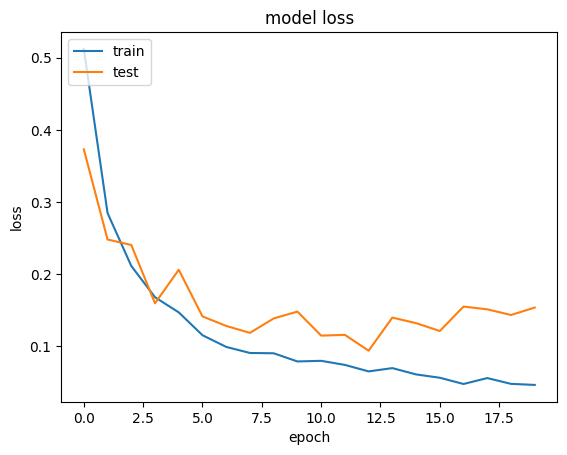

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()



In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/InceptionResNetV2.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 37s 24ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix InceptionResNetV2"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix InceptionResNetV2', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 39s 23ms/step
              precision    recall  f1-score   support

           A       0.86      0.69      0.76        54
           B       0.91      0.72      0.80        54
           C       0.98      0.91      0.94        54
           D       0.74      0.74      0.74        54
           E       1.00      0.54      0.70        54
           F       0.97      0.52      0.67        54
           G       0.69      0.96      0.81        54
           H       0.85      0.61      0.71        54
           I       0.83      0.96      0.89        54
           J       1.00      0.98      0.99        54
           K       0.70      0.78      0.74        54
           L       0.90      1.00      0.95        54
           M       0.51      1.00      0.67        54
           N       1.00      0.15      0.26        54
           O       0.75      0.93      0.83        54
           P       0.64      0.83      0.73        54
           Q       0.5

# InceptionV3

In [ ]:
import keras
base_model = keras.applications.InceptionV3(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

87910968/87910968 [==============================] - 1s 0us/step
Model: "model_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_10 (InputLayer)       [(None, 160, 120, 3)]     0         
                                                                 
 inception_v3 (Functional)   (None, 3, 2, 2048)        21802784  
                                                                 
 global_average_pooling2d_4  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_4 (Dense)             (None, 26)                53274     
                                                                 
Total params: 21856058 (83.37 MB)
Trainable params: 53274 (208.10 KB)
Non-trainable params: 21802784 (83.17 MB)
_________________________________________________________________


In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/InceptionV3.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/InceptionV3.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 35s 100ms/step - loss: 0.5169 - categorical_accuracy: 0.3606 - val_loss: 0.4072 - val_categorical_accuracy: 0.4475
Epoch 2/20
275/275 [==============================] - 17s 63ms/step - loss: 0.2557 - categorical_accuracy: 0.5846 - val_loss: 0.2307 - val_categorical_accuracy: 0.6125
Epoch 3/20
275/275 [==============================] - 17s 64ms/step - loss: 0.1794 - categorical_accuracy: 0.6733 - val_loss: 0.2563 - val_categorical_accuracy: 0.5817
Epoch 4/20
275/275 [==============================] - 20s 73ms/step - loss: 0.1435 - categorical_accuracy: 0.7184 - val_loss: 0.1737 - val_categorical_accuracy: 0.6550
Epoch 5/20
275/275 [==============================] - 19s 69ms/step - loss: 0.1139 - categorical_accuracy: 0.7650 - val_loss: 0.1850 - val_categorical_accuracy: 0.6658
Epoch 6/20
275/275 [==============================] - 18s 64ms/step - loss: 0.0966 - categorical_accuracy: 0.7957 - val_loss: 0.1734 - val_categorical_accuracy

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 15s 53ms/step - loss: 0.0249 - categorical_accuracy: 0.9254
Evaluate Train Accuracy: 92.54%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 6s 84ms/step - loss: 0.1792 - categorical_accuracy: 0.7292
Evaluate Validation Accuracy: 72.92%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 23s 16ms/step - loss: 0.1823 - categorical_accuracy: 0.7336
Evaluate Test Accuracy: 73.36%


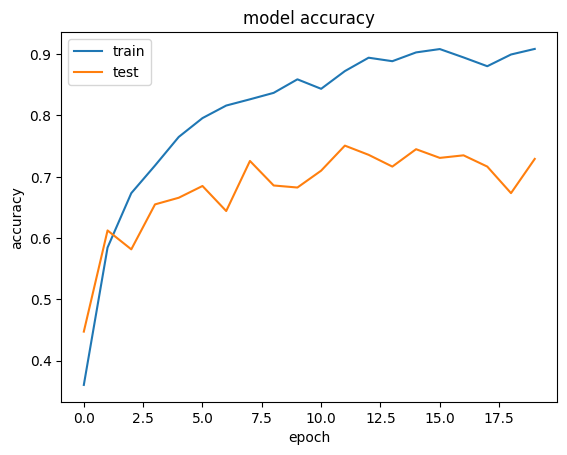

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

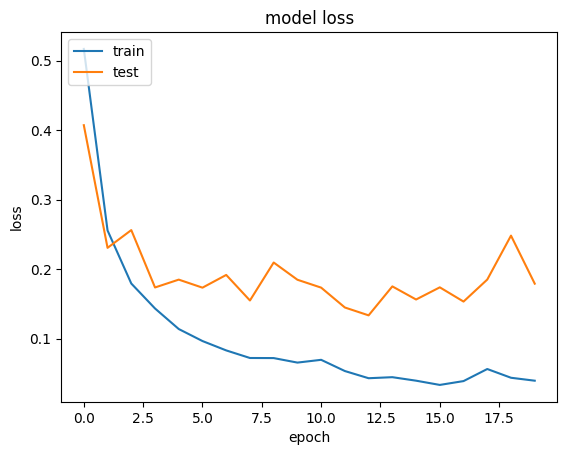

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/InceptionV3.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 28s 17ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix InceptionV3"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix InceptionV3', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 18s 12ms/step
              precision    recall  f1-score   support

           A       0.94      0.57      0.71        54
           B       0.88      0.56      0.68        54
           C       1.00      0.74      0.85        54
           D       0.76      0.69      0.72        54
           E       0.69      0.69      0.69        54
           F       0.65      0.85      0.74        54
           G       0.79      0.85      0.82        54
           H       0.33      0.81      0.47        54
           I       0.97      0.54      0.69        54
           J       1.00      1.00      1.00        54
           K       0.62      0.76      0.68        54
           L       1.00      0.91      0.95        54
           M       0.54      0.98      0.70        54
           N       0.85      0.43      0.57        54
           O       0.75      0.89      0.81        54
           P       0.49      0.56      0.52        54
           Q       0.8

# Resnet50V2

In [ ]:
import keras
base_model = keras.applications.ResNet50V2(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_14 (InputLayer)       [(None, 160, 120, 3)]     0         
                                                                 
 resnet50v2 (Functional)     (None, 5, 4, 2048)        23564800  
                                                                 
 global_average_pooling2d_6  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_6 (Dense)             (None, 26)                53274     
                                                                 
Total params: 23618074 (90.10 MB)
Trainable params: 53274 (208.10 KB)
Non-trainable params: 23564800 (89.89 MB)
_________________________________________________________________


In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/ResNet50V2.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/ResNet50V2.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 26s 76ms/step - loss: 0.4438 - categorical_accuracy: 0.3722 - val_loss: 0.2712 - val_categorical_accuracy: 0.5525
Epoch 2/20
275/275 [==============================] - 18s 67ms/step - loss: 0.2059 - categorical_accuracy: 0.6356 - val_loss: 0.1866 - val_categorical_accuracy: 0.6550
Epoch 3/20
275/275 [==============================] - 17s 63ms/step - loss: 0.1292 - categorical_accuracy: 0.7575 - val_loss: 0.1578 - val_categorical_accuracy: 0.6975
Epoch 4/20
275/275 [==============================] - 18s 66ms/step - loss: 0.0946 - categorical_accuracy: 0.8153 - val_loss: 0.1327 - val_categorical_accuracy: 0.7483
Epoch 5/20
275/275 [==============================] - 21s 76ms/step - loss: 0.0684 - categorical_accuracy: 0.8672 - val_loss: 0.1215 - val_categorical_accuracy: 0.7517
Epoch 6/20
275/275 [==============================] - 18s 66ms/step - loss: 0.0558 - categorical_accuracy: 0.8919 - val_loss: 0.1120 - val_categorical_accuracy:

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 14s 49ms/step - loss: 0.0116 - categorical_accuracy: 0.9712
Evaluate Train Accuracy: 97.12%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 5s 64ms/step - loss: 0.0993 - categorical_accuracy: 0.7841
Evaluate Validation Accuracy: 78.41%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 19s 12ms/step - loss: 0.0977 - categorical_accuracy: 0.8184
Evaluate Test Accuracy: 81.84%


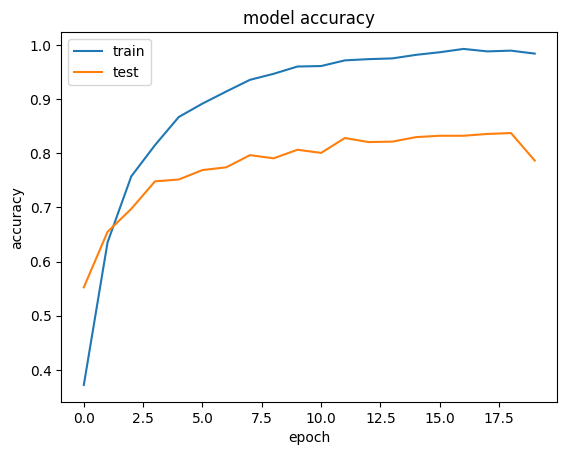

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

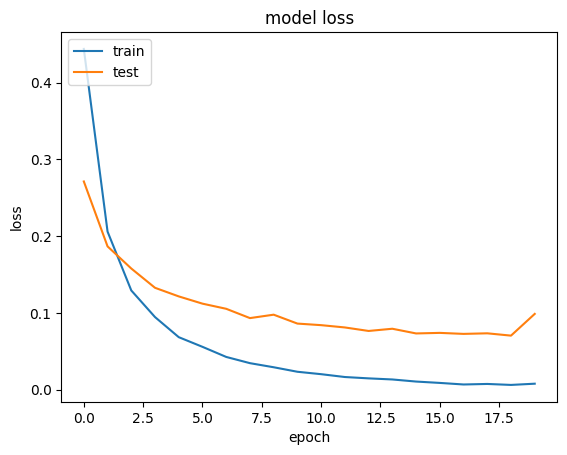

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/ResNet50V2.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 13s 9ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix ResNet50V2"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix ResNet50V2', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 13s 9ms/step
              precision    recall  f1-score   support

           A       0.80      0.81      0.81        54
           B       0.79      0.83      0.81        54
           C       0.88      0.96      0.92        54
           D       0.87      0.89      0.88        54
           E       0.81      0.94      0.87        54
           F       0.97      0.69      0.80        54
           G       0.89      0.94      0.92        54
           H       0.77      0.67      0.71        54
           I       1.00      0.63      0.77        54
           J       0.91      0.98      0.95        54
           K       0.85      0.74      0.79        54
           L       0.85      0.93      0.88        54
           M       0.94      0.87      0.90        54
           N       0.82      0.93      0.87        54
           O       0.98      0.78      0.87        54
           P       0.85      0.54      0.66        54
           Q       0.54

# Resnet101V2

In [ ]:
import keras
base_model = keras.applications.ResNet101V2(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

171317808/171317808 [==============================] - 1s 0us/step
Model: "model_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_16 (InputLayer)       [(None, 160, 120, 3)]     0         
                                                                 
 resnet101v2 (Functional)    (None, 5, 4, 2048)        42626560  
                                                                 
 global_average_pooling2d_7  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_7 (Dense)             (None, 26)                53274     
                                                                 
Total params: 42679834 (162.81 MB)
Trainable params: 53274 (208.10 KB)
Non-trainable params: 42626560 (162.61 MB)
_________________________________________________________________


In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/ResNet101V2.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/ResNet101V2.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 28s 80ms/step - loss: 0.4375 - categorical_accuracy: 0.3860 - val_loss: 0.2575 - val_categorical_accuracy: 0.5492
Epoch 2/20
275/275 [==============================] - 20s 73ms/step - loss: 0.1858 - categorical_accuracy: 0.6545 - val_loss: 0.1822 - val_categorical_accuracy: 0.6542
Epoch 3/20
275/275 [==============================] - 20s 74ms/step - loss: 0.1208 - categorical_accuracy: 0.7602 - val_loss: 0.1446 - val_categorical_accuracy: 0.7058
Epoch 4/20
275/275 [==============================] - 20s 73ms/step - loss: 0.0849 - categorical_accuracy: 0.8221 - val_loss: 0.1226 - val_categorical_accuracy: 0.7417
Epoch 5/20
275/275 [==============================] - 20s 74ms/step - loss: 0.0628 - categorical_accuracy: 0.8703 - val_loss: 0.1145 - val_categorical_accuracy: 0.7608
Epoch 6/20
275/275 [==============================] - 20s 73ms/step - loss: 0.0464 - categorical_accuracy: 0.9070 - val_loss: 0.0971 - val_categorical_accuracy:

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 16s 59ms/step - loss: 0.0168 - categorical_accuracy: 0.9533
Evaluate Train Accuracy: 95.33%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 4s 55ms/step - loss: 0.0977 - categorical_accuracy: 0.8048
Evaluate Validation Accuracy: 80.48%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 40s 28ms/step - loss: 0.0931 - categorical_accuracy: 0.8162
Evaluate Test Accuracy: 81.62%


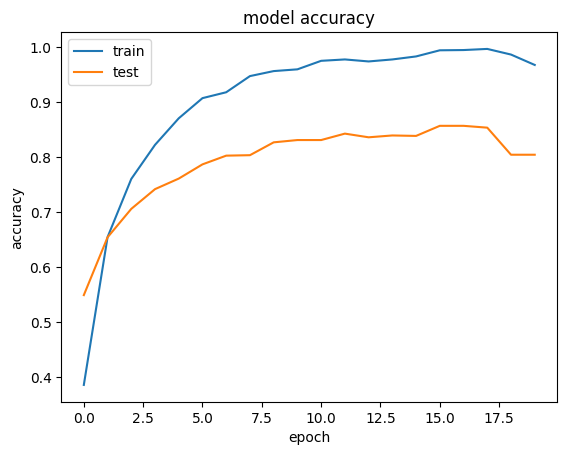

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

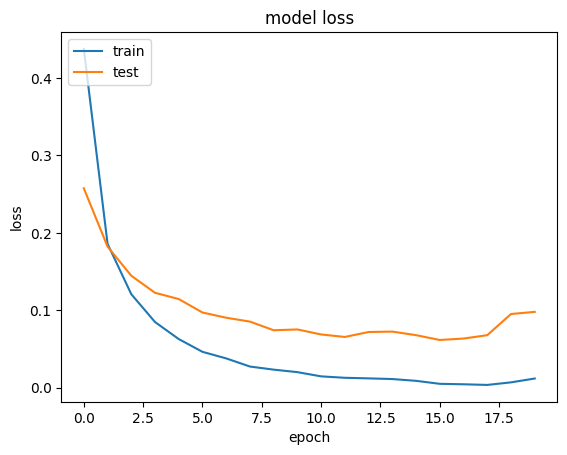

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/ResNet50V2.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 13s 9ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix ResNet101V2"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix ResNet101V2', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 22s 14ms/step
              precision    recall  f1-score   support

           A       0.90      0.83      0.87        54
           B       0.69      0.83      0.76        54
           C       0.98      0.96      0.97        54
           D       0.81      0.80      0.80        54
           E       0.76      0.89      0.82        54
           F       0.88      0.80      0.83        54
           G       0.81      0.87      0.84        54
           H       0.86      0.69      0.76        54
           I       0.94      0.93      0.93        54
           J       1.00      0.98      0.99        54
           K       0.72      0.93      0.81        54
           L       1.00      0.89      0.94        54
           M       0.50      0.98      0.67        54
           N       1.00      0.22      0.36        54
           O       0.96      0.80      0.87        54
           P       0.88      0.54      0.67        54
           Q       0.8

# Resnet152V2

In [ ]:
import keras
base_model = keras.applications.ResNet101V2(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

234545216/234545216 [==============================] - 2s 0us/step
Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_18 (InputLayer)       [(None, 160, 120, 3)]     0         
                                                                 
 resnet152v2 (Functional)    (None, 5, 4, 2048)        58331648  
                                                                 
 global_average_pooling2d_8  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_8 (Dense)             (None, 26)                53274     
                                                                 
Total params: 58384922 (222.72 MB)
Trainable params: 53274 (208.10 KB)
Non-trainable params: 58331648 (222.52 MB)
_________________________________________________________________


In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/ResNet152V2.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/ResNet152V2.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 46s 133ms/step - loss: 0.1991 - categorical_accuracy: 0.6433 - val_loss: 0.1843 - val_categorical_accuracy: 0.6483
Epoch 2/20
275/275 [==============================] - 24s 86ms/step - loss: 0.1161 - categorical_accuracy: 0.7723 - val_loss: 0.1601 - val_categorical_accuracy: 0.6842
Epoch 3/20
275/275 [==============================] - 25s 92ms/step - loss: 0.0787 - categorical_accuracy: 0.8408 - val_loss: 0.1234 - val_categorical_accuracy: 0.7458
Epoch 4/20
275/275 [==============================] - 26s 95ms/step - loss: 0.0564 - categorical_accuracy: 0.8824 - val_loss: 0.1055 - val_categorical_accuracy: 0.7775
Epoch 5/20
275/275 [==============================] - 25s 90ms/step - loss: 0.0402 - categorical_accuracy: 0.9197 - val_loss: 0.0983 - val_categorical_accuracy: 0.7975
Epoch 6/20
275/275 [==============================] - 25s 89ms/step - loss: 0.0309 - categorical_accuracy: 0.9365 - val_loss: 0.0908 - val_categorical_accuracy

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 17s 63ms/step - loss: 0.0068 - categorical_accuracy: 0.9823
Evaluate Train Accuracy: 98.23%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 6s 78ms/step - loss: 0.0985 - categorical_accuracy: 0.8189
Evaluate Validation Accuracy: 81.89%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 33s 24ms/step - loss: 0.0893 - categorical_accuracy: 0.8234
Evaluate Test Accuracy: 82.34%


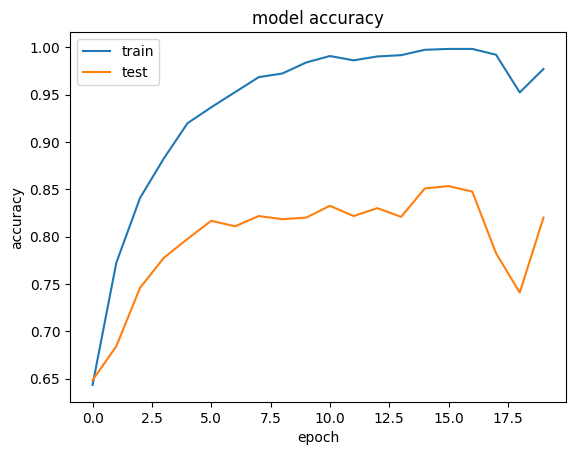

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

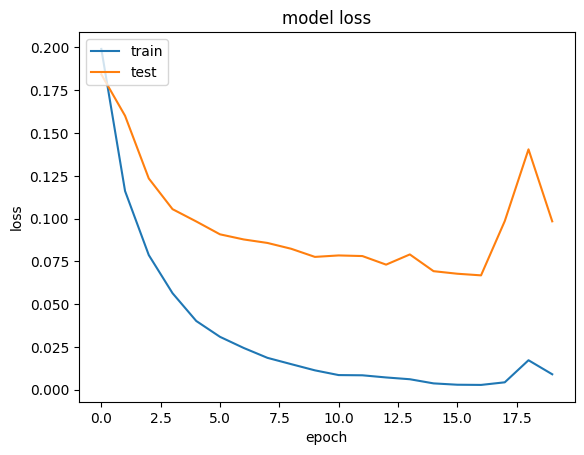

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/ResNet152V2.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 38s 23ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix ResNet152V2"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix ResNet152V2', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 45s 31ms/step
              precision    recall  f1-score   support

           A       0.98      0.74      0.84        54
           B       0.73      0.91      0.81        54
           C       1.00      0.98      0.99        54
           D       0.86      0.78      0.82        54
           E       0.89      0.87      0.88        54
           F       0.83      0.72      0.77        54
           G       0.76      0.83      0.80        54
           H       0.56      0.87      0.68        54
           I       0.85      0.94      0.89        54
           J       0.82      1.00      0.90        54
           K       0.89      0.74      0.81        54
           L       0.94      0.91      0.92        54
           M       0.85      0.96      0.90        54
           N       0.85      0.81      0.83        54
           O       0.92      0.85      0.88        54
           P       0.88      0.43      0.57        54
           Q       0.8

# Xception

In [ ]:
import keras
base_model = keras.applications.Xception(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(160, 120, 3),
    include_top=False)  # Do not include the ImageNet classifier at the top.

base_model.trainable = False


inputs = keras.Input(shape=(160, 120, 3))
# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning, as you will
# learn in a few paragraphs.
x = base_model(inputs, training=False)
# Convert features of shape `base_model.output_shape[1:]` to vectors
x = keras.layers.GlobalAveragePooling2D()(x)
# A Dense classifier with a single unit (binary classification)
outputs = keras.layers.Dense(26)(x)
model = keras.Model(inputs, outputs)


model.summary()

83683744/83683744 [==============================] - 0s 0us/step
Model: "model_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_20 (InputLayer)       [(None, 160, 120, 3)]     0         
                                                                 
 xception (Functional)       (None, 5, 4, 2048)        20861480  
                                                                 
 global_average_pooling2d_9  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_9 (Dense)             (None, 26)                53274     
                                                                 
Total params: 20914754 (79.78 MB)
Trainable params: 53274 (208.10 KB)
Non-trainable params: 20861480 (79.58 MB)
_________________________________________________________________


In [ ]:

# from keras.callbacks import EarlyStopping
# from keras.callbacks import ReduceLROnPlateau
from keras.callbacks import CSVLogger
from keras.callbacks import ModelCheckpoint

# # Define callbacks for learning rate scheduling, logging and best checkpoints saving
callbackss = [
    ModelCheckpoint('/content/Xception.h5', monitor='val_categorical_accuracy', save_best_only=True, mode='max'),
#     ReduceLROnPlateau(monitor='val_Dice_coef', factor=0.1, verbose=1, patience=5, mode='max'), ## new_lr = lr * factor # 5
#     EarlyStopping(monitor='val_Dice_coef', min_delta=0, verbose=1, patience=15, mode='max', restore_best_weights=True), # 8
    CSVLogger('/content/Xception.csv',  separator=",")
]

In [ ]:
# import tensorflow as tf
# from tensorflow import keras

# class CategoricalFocalAccuracy(keras.metrics.Metric):
#     def __init__(self, gamma=2.0, alpha=0.25, name='categorical_focal_accuracy', **kwargs):
#         super(CategoricalFocalAccuracy, self).__init__(name=name, **kwargs)
#         self.gamma = gamma
#         self.alpha = alpha
#         self.accuracy = self.add_weight(name='accuracy', initializer='zeros')
#         self.total_samples = self.add_weight(name='total_samples', initializer='zeros')
#         self.total_correct_samples = self.add_weight(name='total_correct_samples', initializer='zeros')

#     def update_state(self, y_true, y_pred, sample_weight=None):
#         y_pred = tf.nn.softmax(y_pred, axis=-1)
#         y_true = tf.cast(y_true, tf.float32)
#         y_pred_max = tf.reduce_max(y_pred, axis=-1, keepdims=True)
#         y_pred_max = tf.cast(tf.equal(y_pred, y_pred_max), tf.float32)
#         y_pred = (1 - self.alpha) * y_pred + self.alpha * y_pred_max
#         ce = -y_true * tf.math.log(y_pred)
#         focal_loss = tf.pow(1 - y_pred, self.gamma) * ce
#         accuracy = tf.reduce_mean(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32))
#         self.accuracy.assign_add(accuracy)
#         self.total_samples.assign_add(tf.cast(tf.shape(y_true)[0], tf.float32))
#         self.total_correct_samples.assign_add(tf.reduce_sum(tf.cast(tf.equal(tf.argmax(y_true, axis=-1), tf.argmax(y_pred, axis=-1)), tf.float32)))

#     def result(self):
#         return self.total_correct_samples / self.total_samples

#     def reset_states(self):
#         self.accuracy.assign(0)
#         self.total_samples.assign(0)
#         self.total_correct_samples.assign(0)

# # Usage in your model compilation
# model.compile(optimizer=keras.optimizers.Adam(),
#               loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
#               metrics=[CategoricalFocalAccuracy()])


In [ ]:
from keras.callbacks import History
history = History()


model.compile(optimizer=keras.optimizers.Adam(),
              loss=keras.losses.CategoricalFocalCrossentropy(from_logits=True),
              metrics=[keras.metrics.CategoricalAccuracy()])
history= model.fit_generator(
    train_generator,
    steps_per_epoch=train_generator.samples // CFG.batch_size,
    epochs=20,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // CFG.batch_size,
    callbacks=[history, callbackss]
)

Epoch 1/20
275/275 [==============================] - 24s 73ms/step - loss: 0.4742 - categorical_accuracy: 0.3339 - val_loss: 0.3477 - val_categorical_accuracy: 0.4483
Epoch 2/20
275/275 [==============================] - 26s 95ms/step - loss: 0.2710 - categorical_accuracy: 0.5601 - val_loss: 0.2591 - val_categorical_accuracy: 0.5783
Epoch 3/20
275/275 [==============================] - 18s 65ms/step - loss: 0.2047 - categorical_accuracy: 0.6492 - val_loss: 0.2314 - val_categorical_accuracy: 0.6017
Epoch 4/20
275/275 [==============================] - 19s 69ms/step - loss: 0.1636 - categorical_accuracy: 0.7170 - val_loss: 0.2109 - val_categorical_accuracy: 0.6050
Epoch 5/20
275/275 [==============================] - 17s 64ms/step - loss: 0.1403 - categorical_accuracy: 0.7343 - val_loss: 0.1797 - val_categorical_accuracy: 0.6642
Epoch 6/20
275/275 [==============================] - 20s 72ms/step - loss: 0.1168 - categorical_accuracy: 0.7753 - val_loss: 0.1635 - val_categorical_accuracy:

In [ ]:
scores = model.evaluate(train_generator)
print("%s: %.2f%%" % ("Evaluate Train Accuracy", scores[1]*100))

276/276 [==============================] - 14s 49ms/step - loss: 0.0204 - categorical_accuracy: 0.9658
Evaluate Train Accuracy: 96.58%


In [ ]:
scores = model.evaluate(validation_generator)
print("%s: %.2f%%" % ("Evaluate Validation Accuracy", scores[1]*100))

76/76 [==============================] - 5s 59ms/step - loss: 0.1060 - categorical_accuracy: 0.7749
Evaluate Validation Accuracy: 77.49%


In [ ]:
scores = model.evaluate(test_generator)
print("%s: %.2f%%" % ("Evaluate Test Accuracy", scores[1]*100))

1404/1404 [==============================] - 12s 8ms/step - loss: 0.1038 - categorical_accuracy: 0.7856
Evaluate Test Accuracy: 78.56%


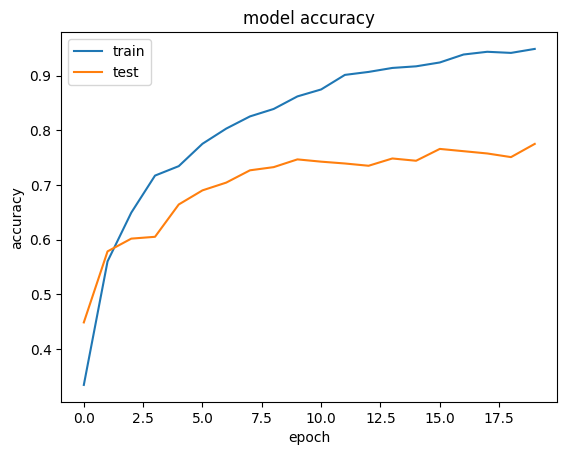

In [ ]:
#plooting the results

import matplotlib.pyplot as plt

#summarize history for accuracy
plt.plot(history.history['categorical_accuracy'])
plt.plot(history.history['val_categorical_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

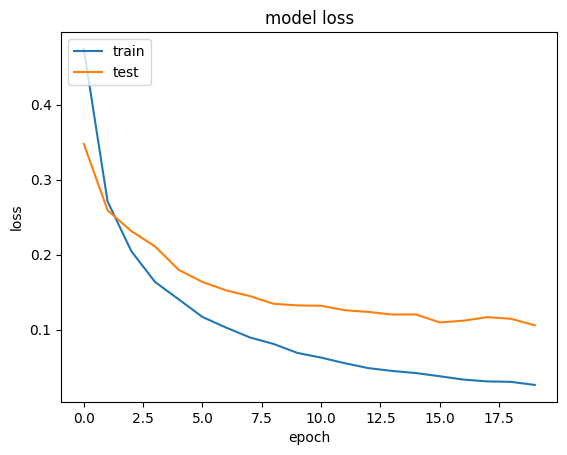

In [ ]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [ ]:
# Visualize Training and Validation Results

# Create Subplot
fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=["Model Loss", "Model Accuracy"],
)

# Configuration Plot
class PlotCFG:
    marker_size = 8
    line_size = 2
    train_color = "#76503d"
    valid_color = "#deb392"

# Loss Plot
loss = history.history['loss']
val_loss = history.history['val_loss']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(loss)+1), y=loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Loss"
    ), row=1, col=1
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_loss)+1), y=val_loss,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Loss"
    ), row=1, col=1
)

# Accuracy Plot
acc = history.history['categorical_accuracy']
val_acc = history.history['val_categorical_accuracy']
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(acc)+1), y=acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.train_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.train_color, width=PlotCFG.line_size),
        name="Training Accuracy"
    ), row=1, col=2
)
fig.add_trace(
    go.Scatter(
        x=np.arange(1, len(val_acc)+1), y=val_acc,
        mode="markers+lines",
        marker=dict(
            color=PlotCFG.valid_color, size=PlotCFG.marker_size,
            line=dict(color="White", width=0.5)
        ),
        line=dict(color=PlotCFG.valid_color, width=PlotCFG.line_size),
        name="Validation Accuracy"
    ), row=1, col=2
)

# Update Axes
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_xaxes(title="Epochs", linecolor="Black", ticks="outside", row=1, col=2)
fig.update_yaxes(title="Categorical Loss", linecolor="Black", ticks="outside", row=1, col=1)
fig.update_yaxes(title="Accuracy", linecolor="Black", ticks="outside", row=1, col=2)

# Update Layout
fig.update_layout(
    title="Training Loss and Metrics", title_x=0.5,
    width=950, height=400,
    showlegend=False,
    plot_bgcolor="White",
    paper_bgcolor="White"
)

# Show
fig.show(iframe_connected=True)

In [ ]:
# Confusion Matrix
fine_tuned_model = load_model("/content/Xception.h5")
predictions = fine_tuned_model.predict(test_generator)

# Get the true labels from the generator
true_labels = test_generator.classes

# Compute the confusion matrix using tf.math.confusion_matrix
confusion_matrix = tf.math.confusion_matrix(
        labels=true_labels,
        predictions=predictions.argmax(axis=1),
        num_classes=26)

1404/1404 [==============================] - 11s 7ms/step


In [ ]:
# Create Figure
fig = go.Figure()

# Heatmap
fig.add_trace(
    go.Heatmap(
        z=confusion_matrix,
        x=labels,
        y=labels,
        text=confusion_matrix,
        texttemplate="%{text}",
        textfont={"size": 6},  # Reduce text font size
        colorscale=[[0, '#f4f4f4'], [1.0, '#76503d']],
        showscale=False,
        ygap=2,  # Reduce the ygap for a more compact layout
        xgap=2,  # Reduce the xgap for a more compact layout
        hovertemplate=
        '''
        Actual: %{y}
        Predicted: %{x}
        Total: %{text}
        ''',
        name="Confusion Matrix Xception"
    )
)

# Update Axes
fig.update_xaxes(title="Predicted Values", tickfont_size=8)  # Reduce tick font size
fig.update_yaxes(title="Actual Values", tickfont_size=8)  # Reduce tick font size

# Update Layout
fig.update_layout(title_text='Confusion Matrix Xception', title_x=0.5, font_size=10,  # Reduce title font size
                  width=500,  # Reduce the width further
                  height=500,  # Reduce the height further
                  plot_bgcolor='white',
                  showlegend=False,
                  margin=dict(l=10, r=10, t=30, b=30),  # Adjust margins (l=left, r=right, t=top, b=bottom)
                  paper_bgcolor='white',  # Set paper background color to white
)

# Show
fig.show()


In [ ]:
from sklearn.metrics import classification_report
import numpy as np

# Assuming you have a model and test_generator ready
# Make predictions
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Assuming test_generator has the true labels
# Note: This approach assumes your generator is not shuffled and labels are accessible
true_labels = test_generator.classes

# Generate classification report
report = classification_report(true_labels, predicted_classes, target_names=test_generator.class_indices.keys())
print(report)


1404/1404 [==============================] - 11s 8ms/step
              precision    recall  f1-score   support

           A       0.90      0.83      0.87        54
           B       0.70      0.81      0.75        54
           C       0.98      0.93      0.95        54
           D       1.00      0.61      0.76        54
           E       0.91      0.78      0.84        54
           F       0.57      0.85      0.68        54
           G       0.88      0.52      0.65        54
           H       0.75      0.67      0.71        54
           I       0.77      0.76      0.77        54
           J       1.00      1.00      1.00        54
           K       0.75      0.70      0.72        54
           L       0.96      0.80      0.87        54
           M       0.83      0.80      0.81        54
           N       0.75      0.76      0.75        54
           O       0.80      0.91      0.85        54
           P       0.60      0.69      0.64        54
           Q       0.70